# K-Nearest Neighbors Classifier

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.model_selection import GridSearchCV
from mlxtend.plotting import plot_decision_regions
import time
import numpy as np
import os
from sklearn.preprocessing import StandardScaler

In [8]:
# Set the working directory
# os.chdir(r'/Users/saram/Desktop/Erdos_Institute/project/Data')

## Data Preprocessing

In [9]:
# Read train features
mars_data = pd.read_csv("../Data/train_labels_augmented.csv")
mars_data.set_index(mars_data.sample_id, inplace=True)
mars_data

,sample_id,basalt,carbonate,chloride,iron_oxide,oxalate,oxychlorine,phyllosilicate,silicate,sulfate,...,3_ratio_peak_abund,3_ratio_meanstd_abund,4_ratio,4_ratio_peak_temp,4_ratio_peak_abund,4_ratio_meanstd_abund,5_ratio,5_ratio_peak_temp,5_ratio_peak_abund,5_ratio_meanstd_abund
sample_id,,,,,,,,,,,,,,,,,,,,,
S0000,S0000,0,0,0,0,0,0,0,0,1,...,0.024563,0.009736,28.0,35.420,0.010877,0.009101,19.0,105.458,0.006600,0.002841
S0001,S0001,0,1,0,0,0,0,0,0,0,...,0.033209,0.024006,16.0,497.404,0.093082,0.020585,18.0,-60.370,0.030234,0.019214
S0002,S0002,0,0,0,0,0,1,0,0,0,...,0.294738,0.075850,16.0,545.304,0.040446,0.013012,1.0,145.673,0.004003,0.001801
S0003,S0003,0,1,0,1,0,0,0,0,1,...,0.260027,0.061956,28.0,593.222,0.081701,0.031606,16.0,593.222,0.083077,0.028375
S0004,S0004,0,0,0,1,0,1,1,0,0,...,0.238290,0.082294,16.0,471.733,0.084732,0.026218,44.0,333.273,0.029998,0.013378
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
S0749,S0749,0,0,0,0,0,0,0,0,0,...,0.270481,0.187613,28.0,523.057,0.130122,0.079981,16.0,228.295,0.082464,0.057972
S0750,S0750,0,0,0,0,0,0,1,0,0,...,0.403334,0.152057,32.0,906.311,0.158759,0.122547,16.0,664.846,0.079410,0.041182
S0751,S0751,0,0,0,0,0,0,0,1,0,...,0.261788,0.143669,28.0,-60.026,0.065964,0.068941,32.0,96.019,0.032240,0.019636


In [10]:
# Data preprocessing 
# Drop 'sample_id' and separate features and target labels
X = mars_data.drop(columns=['sample_id', 'basalt', 'carbonate', 'chloride', 'iron_oxide', 'oxalate', 'oxychlorine',
                       'phyllosilicate', 'silicate', 'sulfate', 'sulfide'])
y = mars_data[['basalt', 'carbonate', 'chloride', 'iron_oxide', 'oxalate', 'oxychlorine',
          'phyllosilicate', 'silicate', 'sulfate', 'sulfide']]

### Plotting the database

In [11]:
knn_palette = sns.color_palette("pastel", 10)
knn_palette


[(0.6313725490196078, 0.788235294117647, 0.9568627450980393),
 (1.0, 0.7058823529411765, 0.5098039215686274),
 (0.5529411764705883, 0.8980392156862745, 0.6313725490196078),
 (1.0, 0.6235294117647059, 0.6078431372549019),
 (0.8156862745098039, 0.7333333333333333, 1.0),
 (0.8705882352941177, 0.7333333333333333, 0.6078431372549019),
 (0.9803921568627451, 0.6901960784313725, 0.8941176470588236),
 (0.8117647058823529, 0.8117647058823529, 0.8117647058823529),
 (1.0, 0.996078431372549, 0.6392156862745098),
 (0.7254901960784313, 0.9490196078431372, 0.9411764705882353)]

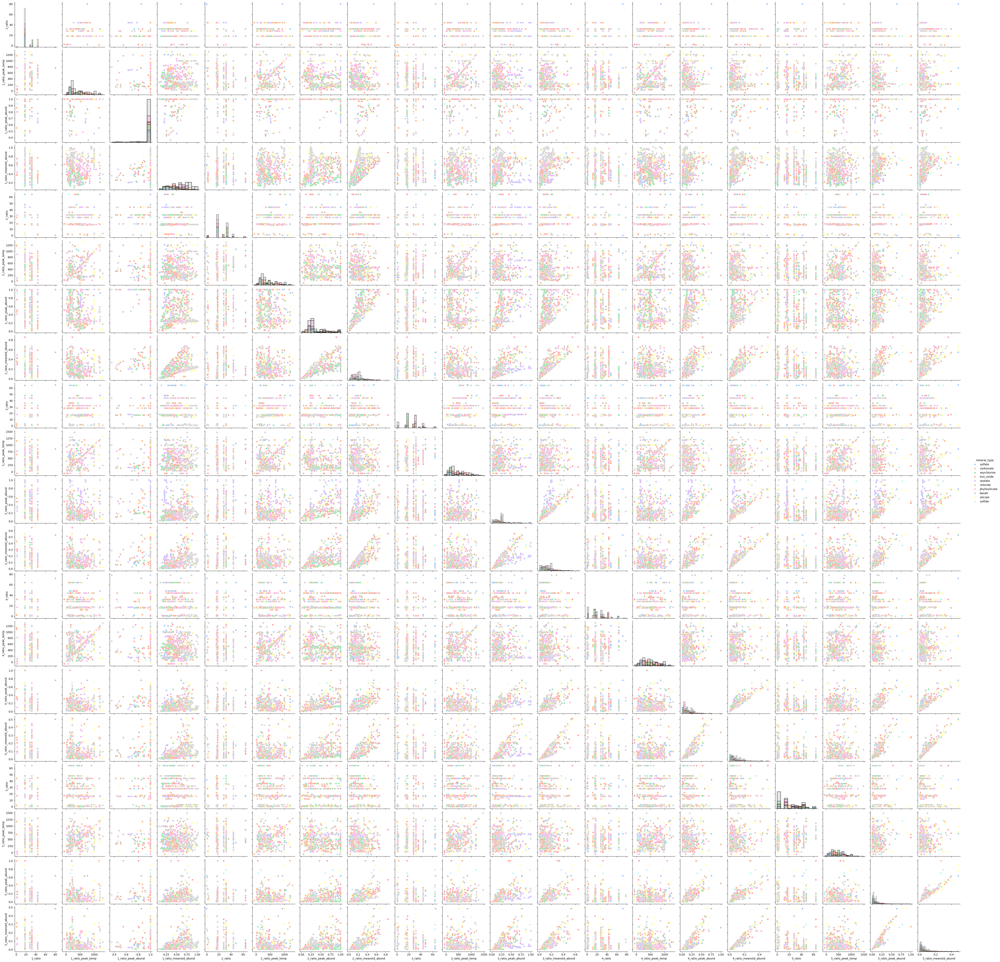

In [11]:
# Set the Seaborn style
sns.set()

# Set figure size
plt.figure(figsize=(16, 9))

# Add a new column to represent the main mineral class
mars_data['mineral_type'] = y.idxmax(axis=1)  # This uses the max value per row to assign a primary mineral

# Use pairplot to visualize all feature combinations with the mineral class as hue
sns.pairplot(
    mars_data,
    vars=X.columns,              # Use all feature columns in X
    hue='mineral_type',          # Use the mineral type as the hue
    palette=knn_palette,         # Apply pastel color palette for different minerals
    diag_kind="hist",            # Histograms on the diagonal for feature distributions
    plot_kws={'s': 40}           # Set the marker size for clarity
)

plt.show()

In [14]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scalar = StandardScaler()
X_train = scalar.fit_transform(X_train)
X_test = scalar.transform(X_test)

### Getting the error rates of a set of models

In [13]:
error_uniform = []
error_distance = []

k_range = range(1, 51)

for k in k_range:
    
    clf = KNeighborsClassifier(n_neighbors = k, weights = 'uniform')
    clf.fit(X_train, y_train)
    predictions = clf.predict(X_test)
    error_uniform.append(1 - accuracy_score(y_test, predictions))
    
    clf = KNeighborsClassifier(n_neighbors = k, weights = 'distance')
    clf.fit(X_train, y_train)
    predictions = clf.predict(X_test)
    error_distance.append(1 - accuracy_score(y_test, predictions))

### Plotting the error rates as a function of the number of neighbors

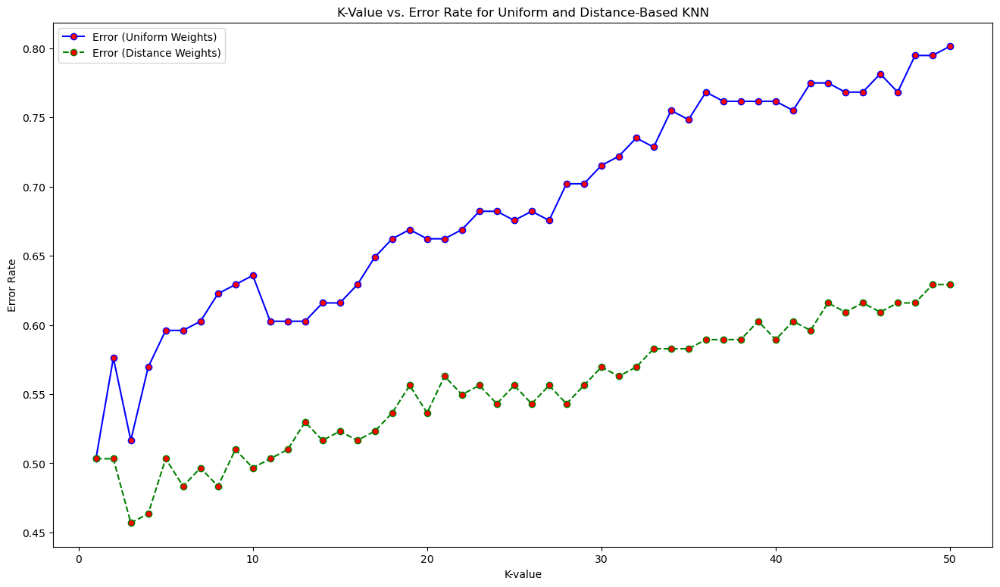

In [15]:
# Set the figure size
plt.figure(figsize=(16, 9))

# Plot error rates for uniform weights
plt.plot(k_range, error_uniform, color='blue', linestyle='solid', 
         marker='o', markerfacecolor='red', label='Error (Uniform Weights)')

# Plot error rates for distance-based weights
plt.plot(k_range, error_distance, color='green', linestyle='dashed', 
         marker='o', markerfacecolor='red', label='Error (Distance Weights)')

# Add legend, labels, and title
plt.legend()
plt.xlabel('K-value')
plt.ylabel('Error Rate')
plt.title('K-Value vs. Error Rate for Uniform and Distance-Based KNN')

# Display the plot
plt.show()

### Choosing a set of parameters to test

In [18]:
# Define the parameter grid for grid search
parameters = {'n_neighbors': range(1, 51), 
              'weights': ['uniform', 'distance']}

### Create an instance of the GridSearchCV class

In [19]:
# Initialize GridSearchCV with KNeighborsClassifier
grid_search = GridSearchCV(estimator=KNeighborsClassifier(), 
                           param_grid=parameters, 
                           scoring='accuracy', 
                           cv=5)  # Optional: specify cross-validation folds (5-fold cross-validation)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Display the best parameters found
print("Best Parameters:", grid_search.best_params_)

# Get the best estimator (model)
clf = grid_search.best_estimator_

# Print the best model
print("Best Estimator (KNN model):", clf)

# Print the best score (accuracy)
print("Best Score (Accuracy):", grid_search.best_score_)

Best Parameters: {'n_neighbors': 4, 'weights': 'distance'}
Best Estimator (KNN model): KNeighborsClassifier(n_neighbors=4, weights='distance')
Best Score (Accuracy): 0.4443250688705234


### Creating the model

In [20]:
# Using the best model found from grid search
clf = grid_search.best_estimator_

# Fit the best model to the training data
clf.fit(X_train, y_train)


KNeighborsClassifier(n_neighbors=4, weights='distance')

### Getting the parameters of the model

In [21]:
clf.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 4,
 'p': 2,
 'weights': 'distance'}

### Make predictions on the test dataset

In [22]:
# Predicting the target labels using the best model from the grid search
y_test_pred = clf.predict(X_test)

# Checking the shape of the predicted labels
print("Shape of y_test_pred:", y_test_pred.shape)

Shape of y_test_pred: (151, 10)


### Print out the classification report

In [23]:
# Print the classification report for multi-label classification
print(classification_report(
    y_test,  # True labels
    y_test_pred,  # Predicted labels
    target_names = ['basalt', 'carbonate', 'chloride', 'iron_oxide', 'oxalate', 
                    'oxychlorine', 'phyllosilicate', 'silicate', 'sulfate', 'sulfide']  # Class names
))


                precision    recall  f1-score   support

        basalt       0.50      0.37      0.42        19
     carbonate       0.71      0.71      0.71        14
      chloride       0.55      0.30      0.39        20
    iron_oxide       0.62      0.61      0.62        33
       oxalate       1.00      0.89      0.94         9
   oxychlorine       0.70      0.82      0.76        34
phyllosilicate       0.69      0.75      0.72        48
      silicate       0.53      0.42      0.47        19
       sulfate       0.83      0.78      0.81        32
       sulfide       0.00      0.00      0.00         4

     micro avg       0.68      0.64      0.66       232
     macro avg       0.61      0.57      0.58       232
  weighted avg       0.66      0.64      0.64       232
   samples avg       0.58      0.57      0.56       232



c:\Users\saram\anaconda3\envs\erdos_fall_2024\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\saram\anaconda3\envs\erdos_fall_2024\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\saram\anaconda3\envs\erdos_fall_2024\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize